In [1]:
!date

Wed Dec  8 16:03:37 PST 2021


# Cell type assignment on Colquitt Bengalese
#### Unfiltered data obtained from using kb with multimapping function. Ref genome includes WRE.

___

In [2]:
%config InlineBackend.figure_format = 'retina'
%load_ext blackcellmagic

In [3]:
import sys
import anndata
import scvi

import scanpy as sc
import numpy as np
from scipy import stats

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

import pandas as pd

sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=2

In [4]:
# set random seed
np.random.seed(926)

In [5]:
def nd(arr):
    """
    Funciton to transform numpy matrix to nd array.
    """
    return np.asarray(arr).reshape(-1)

___

# Load clustered CTRL data

In [6]:
adata = anndata.read('../../finchseq_data/ctrl_leiden.h5ad')
adata

AnnData object with n_obs × n_vars = 15810 × 22151
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

Create copy of adata to run rank_genes_groups on marker genes only:

In [7]:
adata_test = adata.copy()

___

# Plot fraction of each ctrl batch per cluster (after normalizing to total cellcount in each batch):

In [8]:
# Normalize each celltype count to total number of cells in that batch by dividing
df_control = (adata.obs.groupby("leiden")["batch"].value_counts() / adata.obs.groupby("batch")["species"].count()).unstack().fillna(0)
# The above returns a categorical dataframe, so we will convert the columns to strings
df_control.columns = df_control.columns.astype(str)

df_control["total normalized count"] = df_control.sum(axis=1).values

df_control["control1_fraction"] = (df_control["control1"] / df_control["total normalized count"]).values
df_control["control2_fraction"] = (df_control["control2"] / df_control["total normalized count"]).values

df_control["total number of cells"] = adata.obs.groupby("leiden").size().values.astype(int)

df_control.head()

batch,control1,control2,total normalized count,control1_fraction,control2_fraction,total number of cells
leiden,,,,,,
0,0.124142,0.100215,0.224357,0.553324,0.446676,1818
1,0.093004,0.095254,0.188258,0.494025,0.505975,1484
2,0.078357,0.101538,0.179895,0.435571,0.564429,1379
3,0.087883,0.067637,0.155520,0.565091,0.434909,1267
4,0.067807,0.078386,0.146193,0.463819,0.536181,1136


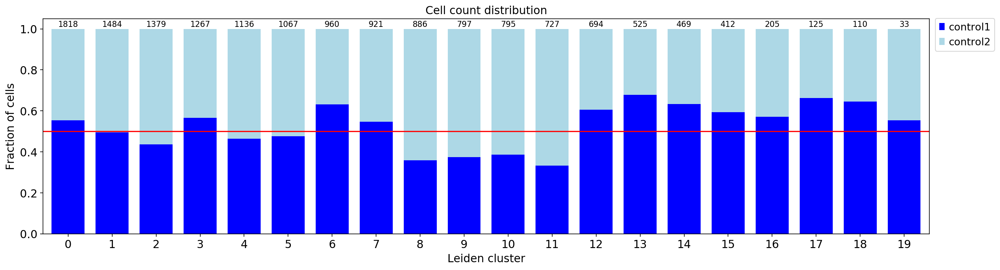

In [9]:
fig, ax = plt.subplots(figsize=(20,5))

clusters = df_control.index.values
width = 0.75

ax.bar(clusters, df_control["control1_fraction"].values, width, color="blue", label="control1")
ax.bar(clusters, df_control["control2_fraction"].values, width, bottom=df_control["control1_fraction"].values, color="lightblue", label="control2")

cellcounts = df_control["total number of cells"].values
# Add total cell count above each bar
for index, value in enumerate(cellcounts):
    ax.text(x = index, y = 1.01, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation = 0, ha="center")
ax.legend(bbox_to_anchor=(1.001, 1.025), loc='upper left')

ax.set(**{
    "title": "Cell count distribution",
    "ylabel": "Fraction of cells",
    "xlabel": "Leiden cluster"
})

ax.axhline(y=0.5, color='r', linestyle='-')

ax.margins(x=0.01)
ax.grid(False) 

fig.show()

No obvious batch effect can be observed.

___

# DE genes in CTRL Leiden clusters

In [10]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test', corr_method="bonferroni", use_raw=False)

Score = z-score underlying the computation of a p-value for each gene for each group

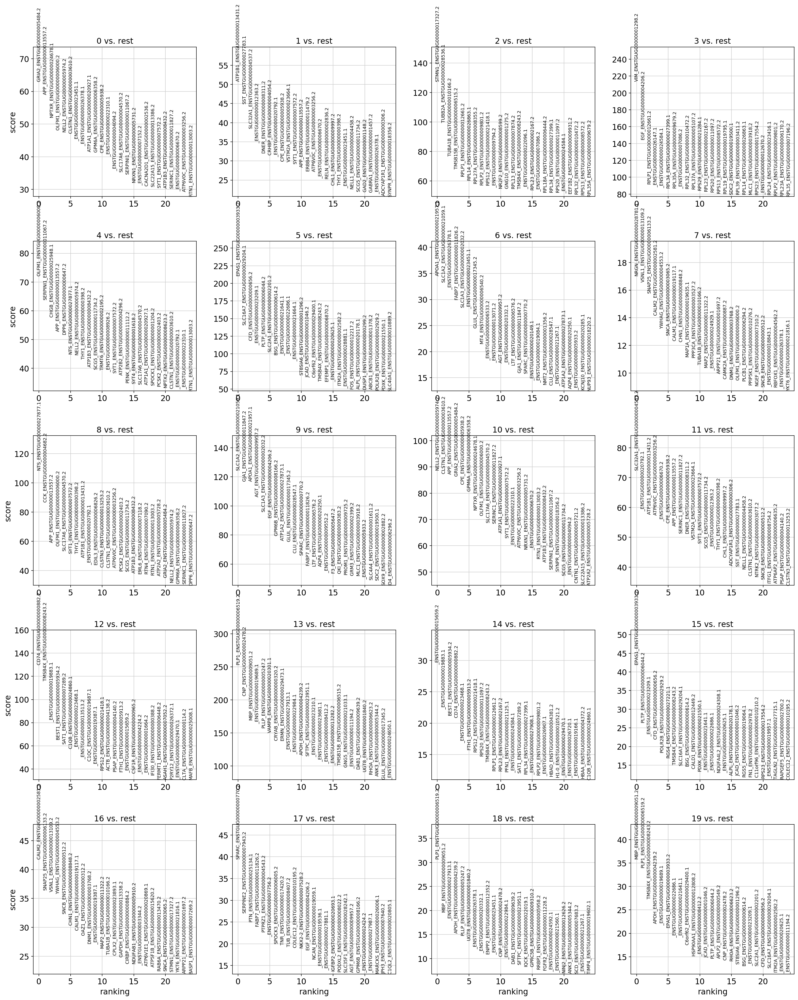

In [11]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, save=False)

Show the 10 top ranked genes per cluster:

In [12]:
leiden_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
leiden_markers

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,GRIA2_ENSTGUG00000005484.2,ATP1B1_ENSTGUG00000013431.2,STMN1_ENSTGUG00000017327.2,VIM_ENSTGUG00000001298.2,OLFM1_ENSTGUG00000006000.2,EPAS1_ENSTGUG00000003933.2,APOA1_ENSTGUG00000021957.1,NRGN_ENSTGUG00000028781.1,NTS_ENSTGUG00000027877.1,SLC1A2_ENSTGUG00000021059.1,NELL2_ENSTGUG00000005974.2,SLC32A1_ENSTGUG00000004537.2,CD74_ENSTGUG00000000882.2,PLP1_ENSTGUG00000006519.2,_ENSTGUG00000015659.2,EPAS1_ENSTGUG00000003933.2,CALM2_ENSTGUG00000002581.2,SPARC_ENSTGUG00000000770.2,PLP1_ENSTGUG00000006519.2,MBP_ENSTGUG00000009051.2
1,APP_ENSTGUG00000013557.2,SST_ENSTGUG00000027783.1,TUBB2A_ENSTGUG00000028536.1,EGF_ENSTGUG00000004206.2,SERPINI1_ENSTGUG00000011067.2,SLC16A7_ENSTGUG00000029204.1,SLC1A2_ENSTGUG00000021059.1,VSNL1_ENSTGUG00000013109.2,CCK_ENSTGUG00000004682.2,GJA1_ENSTGUG00000011847.2,CLSTN1_ENSTGUG00000003610.2,_ENSTGUG00000020792.1,TMSB4X_ENSTGUG00000008243.2,CNP_ENSTGUG00000002478.2,_ENSTGUG00000019883.1,PLTP_ENSTGUG00000006044.2,SNAP25_ENSTGUG00000006133.2,SERPINE2_ENSTGUG00000007943.2,MBP_ENSTGUG00000009051.2,PLP1_ENSTGUG00000006519.2
2,NPTXR_ENSTGUG00000024678.1,SLC32A1_ENSTGUG00000004537.2,TUBA1B_ENSTGUG00000010166.2,RPLP1_ENSTGUG00000012661.2,CHGB_ENSTGUG00000025948.1,CFD_ENSTGUG00000000656.2,_ENSTGUG00000026378.1,SNAP25_ENSTGUG00000006133.2,APP_ENSTGUG00000013557.2,APOA1_ENSTGUG00000021957.1,APP_ENSTGUG00000013557.2,ATP1B1_ENSTGUG00000013431.2,_ENSTGUG00000019883.1,MBP_ENSTGUG00000009051.2,BEST1_ENSTGUG00000005934.2,_ENSTGUG00000023209.1,VSNL1_ENSTGUG00000013109.2,PTN_ENSTGUG00000025134.1,_ENSTGUG00000027913.1,TMSB4X_ENSTGUG00000008243.2
3,OLFM1_ENSTGUG00000006000.2,_ENSTGUG00000012363.2,TMSB15B_ENSTGUG00000006515.2,_ENSTGUG00000026147.1,APP_ENSTGUG00000013557.2,_ENSTGUG00000023209.1,FABP7_ENSTGUG00000011826.2,CALM2_ENSTGUG00000002581.2,OLFM1_ENSTGUG00000006000.2,AGT_ENSTGUG00000009957.2,GRIA2_ENSTGUG00000005484.2,ATP6V0C_ENSTGUG00000003256.2,BEST1_ENSTGUG00000005934.2,_ENSTGUG00000019689.1,CD74_ENSTGUG00000000882.2,CFD_ENSTGUG00000000656.2,YWHAG_ENSTGUG00000004553.2,FABP7_ENSTGUG00000011826.2,APOH_ENSTGUG00000004239.2,APOH_ENSTGUG00000004239.2
4,NELL2_ENSTGUG00000005974.2,DNER_ENSTGUG00000008311.2,RPLP1_ENSTGUG00000012661.2,_ENSTGUG00000024584.1,DPP6_ENSTGUG00000000647.2,PLTP_ENSTGUG00000006044.2,SLC1A3_ENSTGUG00000002032.2,YWHAG_ENSTGUG00000004553.2,SLC17A6_ENSTGUG00000004570.2,SLC1A3_ENSTGUG00000002032.2,CPE_ENSTGUG00000005938.2,_ENSTGUG00000006670.2,SAT1_ENSTGUG00000007289.2,PLLP_ENSTGUG00000005247.2,_ENSTGUG00000023468.1,POLR2B_ENSTGUG00000002929.2,SNCB_ENSTGUG00000000512.2,PTPRZ1_ENSTGUG00000004543.2,PLLP_ENSTGUG00000005247.2,_ENSTGUG00000019689.1
5,CLSTN1_ENSTGUG00000003610.2,CRHBP_ENSTGUG00000004054.2,RPL14_ENSTGUG00000026863.1,RPL34_ENSTGUG00000027399.1,NTS_ENSTGUG00000027877.1,SLC2A1_ENSTGUG00000002201.2,_ENSTGUG00000023451.1,SNCA_ENSTGUG00000003065.2,SYT1_ENSTGUG00000007572.2,EGF_ENSTGUG00000004206.2,GPM6A_ENSTGUG00000006358.2,CPE_ENSTGUG00000005938.2,C1QB_ENSTGUG00000024860.1,VAMP8_ENSTGUG00000020301.1,FTH1_ENSTGUG00000005913.2,RGS4_ENSTGUG00000027221.1,CHN1_ENSTGUG00000008848.2,_ENSTGUG00000007756.2,UGT8_ENSTGUG00000001840.2,EPAS1_ENSTGUG00000003933.2
6,_ENSTGUG00000023451.1,_ENSTGUG00000020792.1,RPL27A_ENSTGUG00000008355.2,RPL35A_ENSTGUG00000009679.2,NELL2_ENSTGUG00000005974.2,BSG_ENSTGUG00000000614.2,GLUL_ENSTGUG00000017345.2,CALM1_ENSTGUG00000019117.1,THY1_ENSTGUG00000000398.2,GPM6B_ENSTGUG00000008166.2,NPTXR_ENSTGUG00000024678.1,APP_ENSTGUG00000013557.2,_ENSTGUG00000023468.1,CRYAB_ENSTGUG00000000320.2,RPS12_ENSTGUG00000021418.1,TMSB4X_ENSTGUG00000008243.2,CALM1_ENSTGUG00000019117.1,SPOCK3_ENSTGUG00000006005.2,_ENSTGUG00000026378.1,_ENSTGUG00000022686.1
7,_ENSTGUG00000026378.1,CPE_ENSTGUG00000005938.2,RPLP2_ENSTGUG00000009801.2,_ENSTGUG00000007086.2,THY1_ENSTGUG00000000398.2,_ENSTGUG00000021641.1,MT4_ENSTGUG00000006540.2,CHN1_ENSTGUG00000008848.2,ATP1B1_ENSTGUG00000013431.2,ATP1A2_ENSTGUG00000027873.1,OLFM1_ENSTGUG00000006000.2,SERINC1_ENSTGUG0000

In [13]:
# leiden_markers.to_csv("leiden_marker_genes_ctrl.csv", index=False)

___

# Load previously known marker genes

In [14]:
marker_gene_mat = pd.read_excel('marker_genes.xlsx', sheet_name="matrix_v2")

Find gene ID for each gene:

In [15]:
marker_gene_mat["gene_name_id"] = np.arange(len(marker_gene_mat))

In [16]:
# index counter
i = 0

for gene in marker_gene_mat["Gene"].values:
    gene_name_id = []
    
    if gene.startswith("ENS"):
        gni = adata.var.iloc[np.where(adata.var.index.str.contains(gene))]
    
    else:
        gni = adata.var.iloc[np.where(adata.var.index.str.startswith(gene))]

    if len(gni) > 0:
        gene_name_id = gni.index[0]
    else:
        gene_name_id = np.nan

    marker_gene_mat["gene_name_id"][i] = gene_name_id
    i += 1

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


### !!! Check which/if genes were found correctly:

In [17]:
marker_gene_mat[["Gene", "gene_name_id"]]

,Gene,gene_name_id
0,SLC15A2,SLC15A2_ENSTGUG00000026244.1
1,SPEF2,SPEF2_ENSTGUG00000001981.2
2,PLP1,PLP1_ENSTGUG00000006519.2
3,CSF1R,CSF1R_ENSTGUG00000000965.2
4,FLI1,FLI1_ENSTGUG00000020175.1
5,RGS5,RGS5_ENSTGUG00000019064.1
6,LUM,LUM_ENSTGUG00000008175.2
7,HBAD,HBAD_ENSTGUG00000004381.2
8,SLC17A6,SLC17A6_ENSTGUG00000004570.2
9,GAD1,GAD1_ENSTGUG00000008060.2


Notes on the marker genes:  
FNDC9 is a synonym for FNTM2 (HVC-X marker).  
PDGFRA (ENSTGUG00000007756.2) not annotated.  
or107-1 is a synonym for ZF1A (neither, not even ensembl ID, can be found in ref).  
Ki67 (ENSTGUG00000021193) not annotated. 

SOX4 and PDGFRA not in reference genome gtf. This is weird because Colquitt et al report using them as a markers and they use the same ref. genome.

ZF1A, EJZER1, and AR46s also not in ref gtf (not used in Colquitt paper).

In [18]:
# Drop rows with genes not found in dataset
marker_gene_mat = marker_gene_mat.dropna(axis=0)

# Drop columns of celltypes containing only 0s
marker_gene_mat = marker_gene_mat.loc[:, (marker_gene_mat != 0).any(axis=0)]
 
#Set gene_name_id as index and drop "gene" coplumn
marker_gene_mat = marker_gene_mat.set_index("gene_name_id")
marker_gene_mat = marker_gene_mat.drop("Gene", axis=1)

marker_gene_mat

,neuron,glia,vascular,astrocytes,ependymal cells,oligodendrocytes,oligodendrocyte precursor cells,microglia,radial glia,vascular endothelial cells,...,HVC-X,RA,GABAergic neuroblast,adult neural stem cells,migrating neuroblasts,mitochondrial,apoptosis,mammalian neurogenesis,immediate early genes,proliferation
gene_name_id,,,,,,,,,,,,,,,,,,,,,
SLC15A2_ENSTGUG00000026244.1,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SPEF2_ENSTGUG00000001981.2,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PLP1_ENSTGUG00000006519.2,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CSF1R_ENSTGUG00000000965.2,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
FLI1_ENSTGUG00000020175.1,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
RGS5_ENSTGUG00000019064.1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
LUM_ENSTGUG00000008175.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HBAD_ENSTGUG00000004381.2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SLC17A6_ENSTGUG00000004570.2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


___

# Check gene expression of previously known marker genes in CTRL Leiden clusters

In [19]:
# sc.pl.dotplot(
#     adata,
#     marker_gene_mat.index.values,
#     groupby="leiden",
#     title="Marker gene expression in Leiden clusters",
#     use_raw=False
# )

In [20]:
# sc.pl.stacked_violin(adata, 
#                      marker_gene_mat.index.values, 
#                      groupby='leiden', 
#                      title="Marker gene expression in Leiden clusters", 
#                      rotation=90, 
#                      sharey=True,
#                      use_raw=False,
#                      swap_axes=True
#                     )

# Run sc.tl.rank_genes_groups() using only marker genes

Remove all marker genes that do not specify a celltype (e.g. connecitivty (HVC-X, HVC-RA), mammalian neurogenesis, immediate early genes, etc.):

In [21]:
# Drop categories that I do not need for this analysis
marker_mat = marker_gene_mat.filter(["astrocytes", "ependymal cells", "oligodendrocytes", "oligodendrocyte precursor cells", "microglia", "radial glia", "vascular endothelial cells", "mural cells", "red blood cells", "leptomeningeal cells", "glutamatergic neurons", "GABAergic neurons", "dopaminergic neurons", "noradrenergic neurons", "GABAergic neuroblast", "adult neural stem cells", "migrating neuroblasts"], axis=1)
# Drop rows of genes containing only 0s
marker_mat = marker_mat.loc[(marker_mat!=0).any(axis=1)]

In [22]:
marker_mat

,astrocytes,ependymal cells,oligodendrocytes,oligodendrocyte precursor cells,microglia,radial glia,vascular endothelial cells,mural cells,red blood cells,leptomeningeal cells,glutamatergic neurons,GABAergic neurons,dopaminergic neurons,noradrenergic neurons,GABAergic neuroblast,adult neural stem cells,migrating neuroblasts
gene_name_id,,,,,,,,,,,,,,,,,
SLC15A2_ENSTGUG00000026244.1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SPEF2_ENSTGUG00000001981.2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PLP1_ENSTGUG00000006519.2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
CSF1R_ENSTGUG00000000965.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
FLI1_ENSTGUG00000020175.1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
RGS5_ENSTGUG00000019064.1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
LUM_ENSTGUG00000008175.2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
HBAD_ENSTGUG00000004381.2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
SLC17A6_ENSTGUG00000004570.2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [23]:
# Find indices of all marker genes in adata
ens_idx = np.isin(adata_test.var_names, marker_mat.index.values)

# Slice adata based on these indices
adata_test = adata_test[:,ens_idx].copy()
adata_test

AnnData object with n_obs × n_vars = 15810 × 22
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

In [24]:
adata_test.var

,gene_name,highly_variable,means,dispersions,dispersions_norm
CALB1_ENSTGUG00000011825.2,CALB1,True,3.892079e-01,3.176540,2.401569
DDC_ENSTGUG00000007930.2,DDC,True,1.376351e-02,2.638691,0.577231
GAD2_ENSTGUG00000001148.2,GAD2,True,1.051390e+00,3.372384,1.940951
VIM_ENSTGUG00000001298.2,VIM,True,1.984304e+00,3.812140,1.415649
NECTIN3_ENSTGUG00000013600.2,NECTIN3,True,6.679075e-01,3.030409,1.473548
NR2E1_ENSTGUG00000012147.2,NR2E1,False,3.245561e-01,2.046782,-2.844210
SPEF2_ENSTGUG00000001981.2,SPEF2,False,1.059927e-01,2.391468,0.242145
_ENSTGUG00000007756.2,,True,3.654426e-01,3.954365,6.013226
PVALB_ENSTGUG00000010713.2,PVALB,True,1.610196e+00,3.680300,1.375892
LUM_ENSTGUG00000008175.2,LUM,False,6.648030e-03,2.892977,0.921889


In [25]:
sc.tl.rank_genes_groups(adata_test, groupby='leiden', method='t-test', corr_method="bonferroni", use_raw=False)

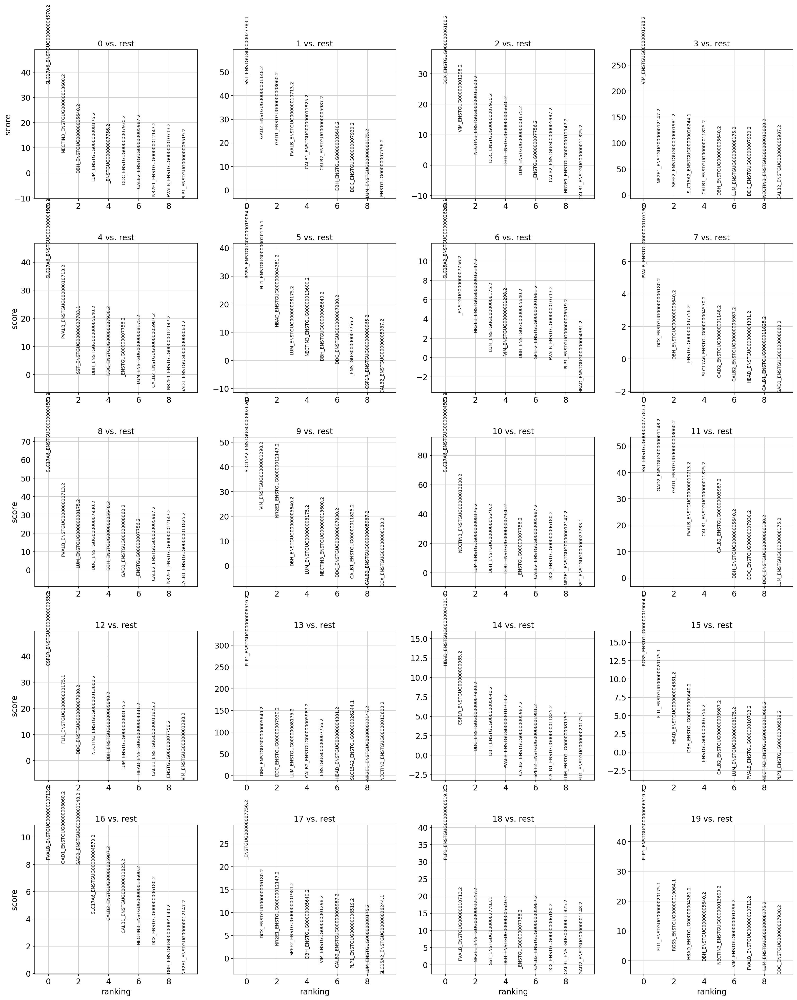

In [26]:
sc.pl.rank_genes_groups(adata_test, n_genes=10, sharey=False, save=False)

### Assign celltypes manually based on marker gene expression in each Leiden cluster

In [27]:
df_leiden = pd.DataFrame()
df_leiden["cluster"] = np.arange(20)
df_leiden["celltype"] = [
    "glutamatergic neurons 1",
    "GABAergic neurons 1",
    "migrating neuroblasts 1",
    "radial glia 1",
    "glutamatergic neurons 2",
    "mural / vascular endothelial cells 1",
    "astrocytes 1",
    "undefined 1",
    "glutamatergic neurons 3",
    "astrocytes 2",
    "glutamatergic neurons 4",
    "GABAergic neurons 2",
    "microglia 1",
    "oligodendrocytes 1",
    "red blood cells 1",
    "mural cells 1",
    "GABAergic neurons 3",
    "oligodendrocyte precursor cells 1",
    "oligodendrocytes 2",
    "oligodendrocytes 3"
]

df_leiden

,cluster,celltype
0,0,glutamatergic neurons 1
1,1,GABAergic neurons 1
2,2,migrating neuroblasts 1
3,3,radial glia 1
4,4,glutamatergic neurons 2
5,5,mural / vascular endothelial cells 1
6,6,astrocytes 1
7,7,undefined 1
8,8,glutamatergic neurons 3
9,9,astrocytes 2


___

# Add manually defined celltypes to AnnData object

In [28]:
# Create copy of leiden cluster column to store manually assigned celltypes
adata.obs["celltype"] = adata.obs.leiden.copy()

In [29]:
# Relabel the clusters in celltype
adata.rename_categories("celltype", df_leiden["celltype"].values)

In [30]:
adata.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype
barcode,,,,,,,
AAACCCAAGCACTGGA-0,zebrafinch,control1,483.000000,0,483.000000,15,mural cells 1
AAACCCAAGCGTCAAG-0,zebrafinch,control1,946.000061,0,946.000061,12,microglia 1
AAACCCAAGGTCACAG-0,zebrafinch,control1,1068.000000,0,1068.000000,1,GABAergic neurons 1
AAACCCAAGTCATTGC-0,zebrafinch,control1,1407.000000,0,1407.000000,9,astrocytes 2
AAACCCAAGTGCTACT-0,zebrafinch,control1,1060.000000,0,1060.000000,11,GABAergic neurons 2


___

# Celltype stats

Show number of cells for each celltype:

In [31]:
df_leiden["total number of cells"] = adata.obs.groupby("leiden").size().values.astype(int)
df_leiden = df_leiden.sort_values(["celltype"])

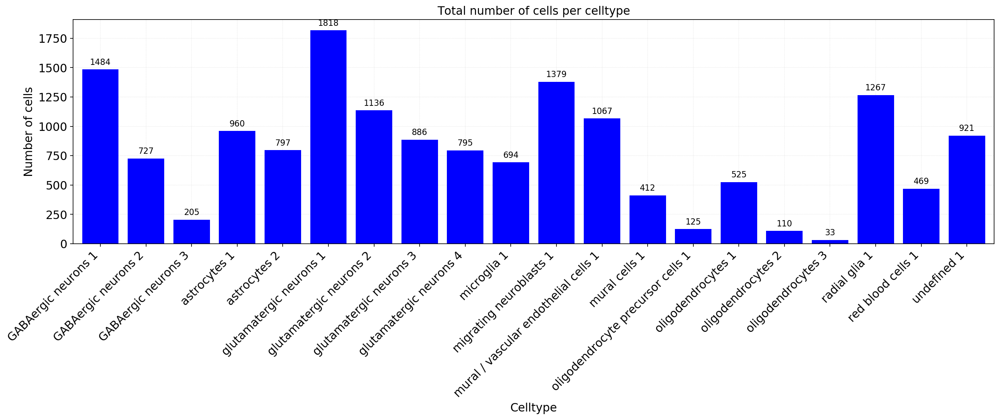

In [32]:
fig, ax = plt.subplots(figsize=(20,5))

clusters = df_leiden["celltype"].values
values = df_leiden["total number of cells"].values

ax.bar(clusters, values, color="blue")

# Add value above each bar
for index, value in enumerate(values):
    ax.text(x = index, y = value + 40, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation = 45, ha="right")

ax.set(**{
    "title": "Total number of cells per celltype",
    "ylabel": "Number of cells",
    "xlabel": "Celltype"
})

ax.margins(x=0.01)
ax.grid(True, ls='--', lw=0.2)
ax.set_axisbelow(True)

fig.show()

### Plot UMAP with manually assigned celltypes:

In [33]:
# Desired order of the clusters
clusters = np.sort(df_leiden["celltype"].values)

# Reordering celltype labels using categorical data type
adata.obs["celltype"] = adata.obs["celltype"].cat.reorder_categories(list(clusters))

# Reordering leiden labels using categorical data type (so order is same as celltype labels)
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(list(df_leiden["cluster"].values.astype(str)))

In [34]:
# Define cluster colors
palette = [
    "coral",
    "crimson",
    "orangered",
    "cornflowerblue",
    "darkblue",
    "yellowgreen",
    "seagreen",
    "mediumseagreen",
    "darkgreen",
    "indigo", 
    "hotpink",
    "teal",
    "mediumturquoise",
    "moccasin",
    "darkorange",
    "gold",
    "wheat",
    "orchid",
    "firebrick",
    "grey",
]

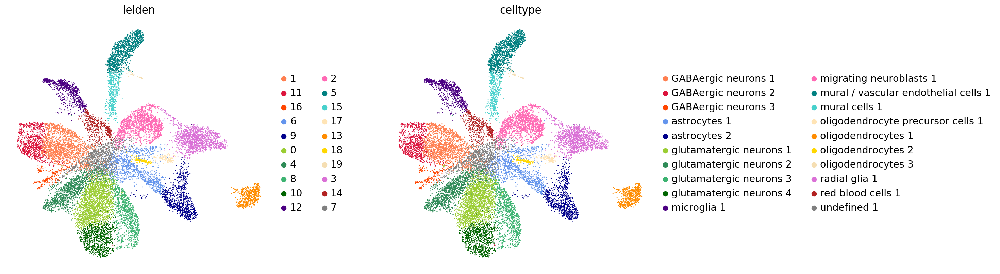

In [35]:
# Plot UMAP and color by Leiden clusters and batch
sc.pl.umap(adata, 
           color=["leiden", "celltype"],
           palette=palette,
           wspace=0.3,
#            arrows=True,
#            projection="3d"
          )

Violin plot showing marker gene expression per celltype:

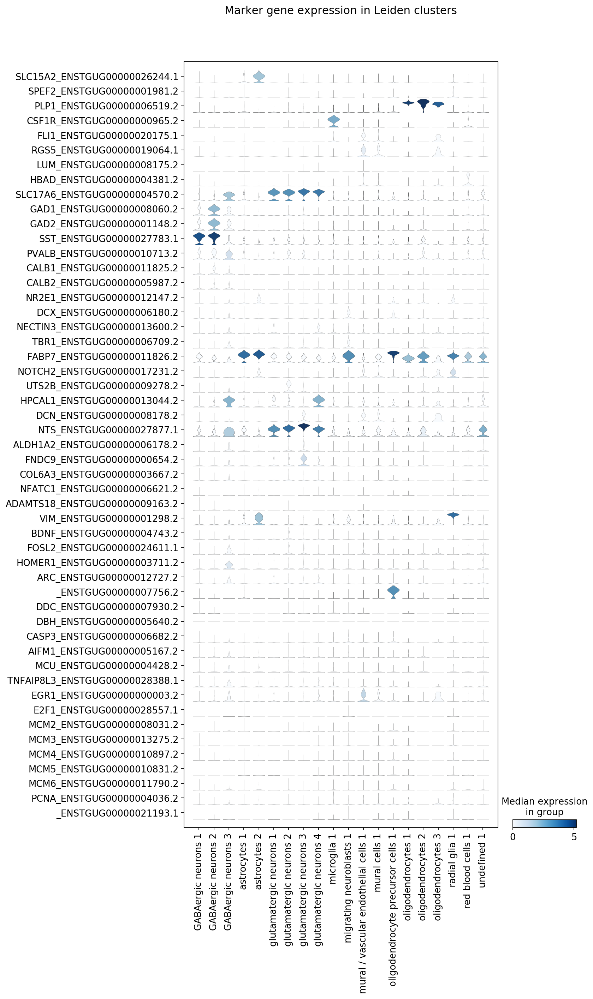

In [36]:
sc.pl.stacked_violin(adata, 
                     marker_gene_mat.index.values, 
                     groupby='celltype', 
                     title="Marker gene expression in Leiden clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True
                    )

___

# Heatmaps showing expression of known marker genes per celltype 

In [37]:
# Define markers in order of celltypes
markers = [
    "GAD1_ENSTGUG00000008060.2",
    "GAD2_ENSTGUG00000001148.2",
    "SST_ENSTGUG00000027783.1",
    "PVALB_ENSTGUG00000010713.2",
    "CALB1_ENSTGUG00000011825.2",
    "CALB2_ENSTGUG00000005987.2",
    "SLC15A2_ENSTGUG00000026244.1",
    "SLC17A6_ENSTGUG00000004570.2",
    "CSF1R_ENSTGUG00000000965.2",
    "DCX_ENSTGUG00000006180.2",
    "RGS5_ENSTGUG00000019064.1",
    "FLI1_ENSTGUG00000020175.1",
    "_ENSTGUG00000007756.2",
    "PLP1_ENSTGUG00000006519.2",
    "VIM_ENSTGUG00000001298.2",
    "HBAD_ENSTGUG00000004381.2",
#         "SPEF2_ENSTGUG00000001981.2",
#         "LUM_ENSTGUG00000008175.2",
#         "DDC_ENSTGUG00000007930.2",
#         "DBH_ENSTGUG00000005640.2",
#         "NR2E1_ENSTGUG00000012147.2",
#         "NECTIN3_ENSTGUG00000013600.2",
]

# Define marker groups
var_groups = [
    (0, 5),
    (6, 6),
    (7, 7),
    (8, 8),
    (9, 9),
    (10, 10),
    (11, 11),
    (12, 12),
    (13, 13),
    (14, 14),
    (15, 15)
]

# Define marker group labels
var_labels = [
    "GABAergic neurons",
    "astrocytes",
    "glutamatergic neurons",
    "microglia",
    "migrating neuroblasts",
    "mural cells",
    "vascular endothelial cells",
    "oligodendrocyte precursor cells",
    "oligodendrocytes",
    "radial glia",
    "red blood cells",
    #     "ependymal cells",
    #     "leptomeningeal cells",
    #     "dopaminergic neurons",
    #     "noradrenergic neurons",
    #     "adult neural stem cells",
    #     "GABAergic neuroblast",
]

Heatmap showing expression of previously known marker genes:

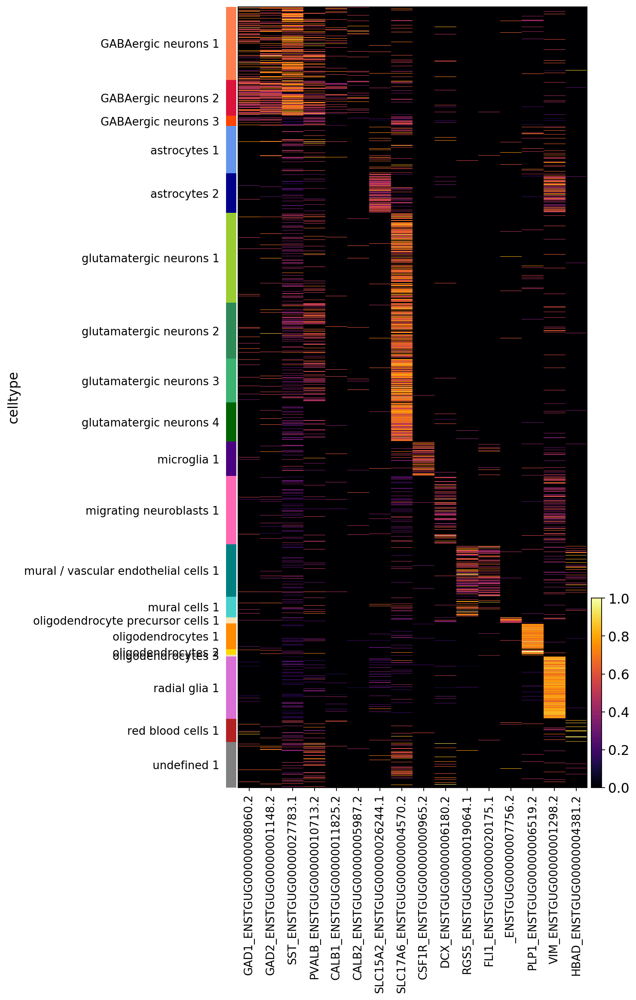

In [38]:
sc.pl.heatmap(
    adata,
    markers,
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(7, 15),
    save=True
)

### Marker for large GABAergic neurons in HVC

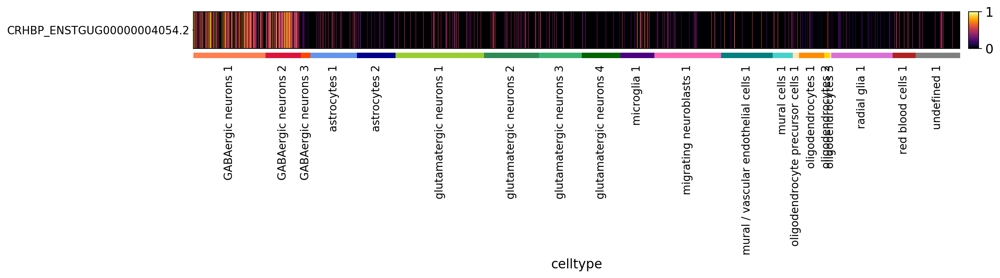

In [39]:
sc.pl.heatmap(
    adata,
    "CRHBP_ENSTGUG00000004054.2",
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 1)
)

Heatmap showing DE genes per celltype:

In [40]:
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order and remove duplications
l_markers = pd.unique(leiden_markers[df_leiden["cluster"].values.astype(str)].head(5).values.ravel('K')) #.ravel('K') makes sure that the values for each columns stay together instead of going per row

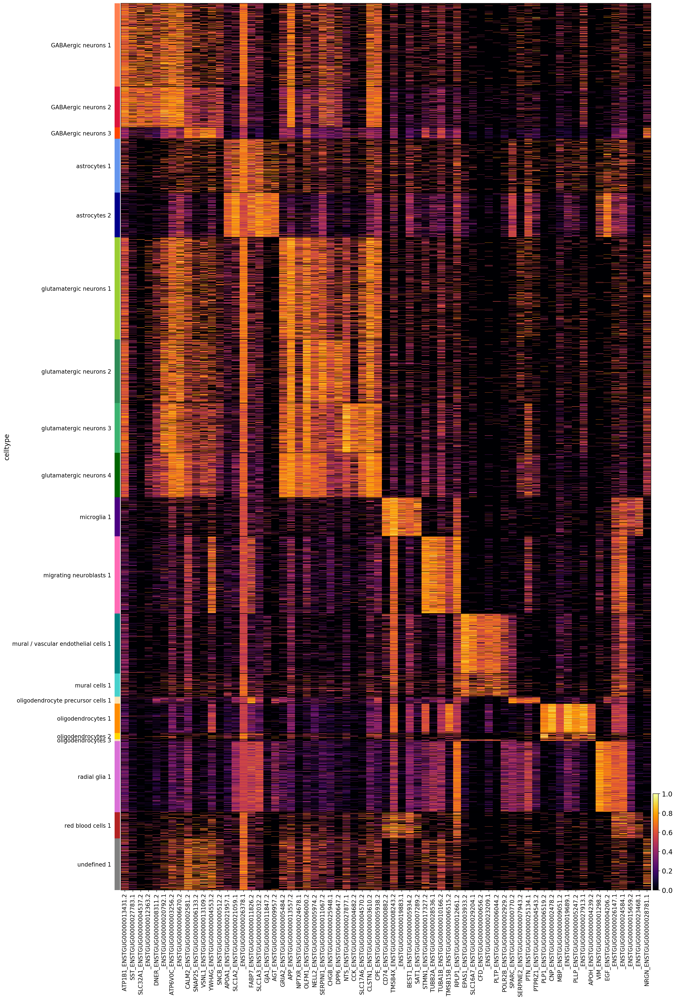

In [41]:
sc.pl.heatmap(
    adata,
    l_markers,
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(20, len(l_markers)/2),
    save=False
)

Save top 5 DE genes per cluster to csv file for further analysis and comparison to experiment DE genes:

In [49]:
df = pd.DataFrame()
# Repeat each cluster 5 times while making sure that cluster order is same as celltype order
df["cluster"] = np.repeat(leiden_markers[df_leiden["cluster"].values.astype(str)].columns, 5)
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order
df["DE gene"] = leiden_markers[df_leiden["cluster"].values.astype(str)].head(5).values.ravel('K')
df["batch"] = "control"
df.to_csv("CTRL_DE-genes.csv")

___

# Assign connectivity (HVC-X / HVC-RA) to glutamatergic neurons

In [42]:
# Drop categories that I do not need for this analysis
conn_mat = marker_gene_mat.filter(["HVC-RA", "HVC-X"], axis=1)
# Drop rows of genes containing only 0s
conn_mat = conn_mat.loc[(conn_mat!=0).any(axis=1)]
conn_mat

,HVC-RA,HVC-X
gene_name_id,,
UTS2B_ENSTGUG00000009278.2,1,0
HPCAL1_ENSTGUG00000013044.2,1,0
DCN_ENSTGUG00000008178.2,0,1
NTS_ENSTGUG00000027877.1,0,1
ALDH1A2_ENSTGUG00000006178.2,0,1
FNDC9_ENSTGUG00000000654.2,0,1


In [43]:
# Find indices of all marker genes in adata
ens_idx = np.isin(adata.var_names, conn_mat.index.values)

# Slice adata based on these indices
adata_conn = adata[:,ens_idx].copy()

# Remove all celltypes but glutamatergic neurons
adata_conn = adata_conn[np.char.startswith(nd(adata_conn.obs.celltype.values).astype(str), "glutamatergic neurons")]

adata_conn

View of AnnData object with n_obs × n_vars = 4635 × 6
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden', 'celltype'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'celltype_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

In [44]:
sc.tl.rank_genes_groups(adata_conn, groupby='celltype', method='t-test', corr_method="bonferroni", use_raw=False)

Trying to set attribute `.uns` of view, copying.


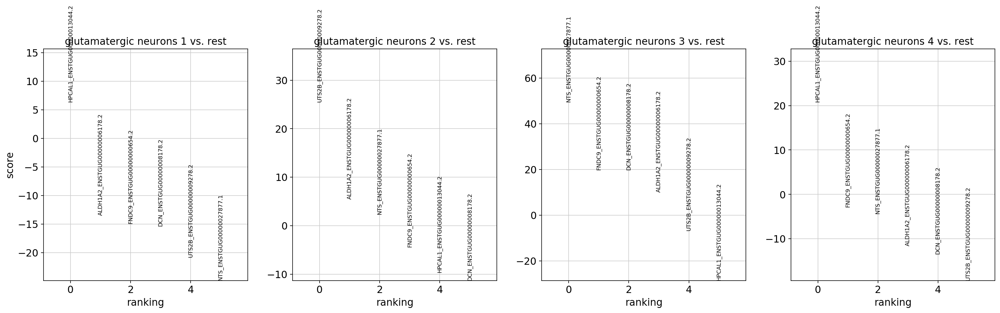

In [45]:
sc.pl.rank_genes_groups(adata_conn, n_genes=6, sharey=False, save=False, ncols=5)

Add assigned connectivity to adata.obs:

In [46]:
# Create copy of leiden cluster column to store manually assigned connectivity
adata.obs["connectivity"] = adata.obs.celltype.copy()

In [47]:
celltypes = nd(adata.obs.celltype.unique())
celltypes

df_connectivity = pd.DataFrame()
df_connectivity["celltypes"] = celltypes
# Using a range of numbers here, otherwise the rename_categories function will not work
df_connectivity["connectivity"] = np.arange(len(celltypes))

# Assign connectivity
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 1"] = "undefined 1"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 2"] = "HVC-RA"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 3"] = "HVC-X"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 4"] = "undefined 2"

# Sort by celltypes (otherwise rename categories does not work correctly)
df_connectivity = df_connectivity.sort_values("celltypes")
df_connectivity

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,celltypes,connectivity
2,GABAergic neurons 1,2
4,GABAergic neurons 2,4
15,GABAergic neurons 3,15
5,astrocytes 1,5
3,astrocytes 2,3
11,glutamatergic neurons 1,undefined 1
12,glutamatergic neurons 2,HVC-RA
14,glutamatergic neurons 3,HVC-X
8,glutamatergic neurons 4,undefined 2
1,microglia 1,1


In [48]:
adata.rename_categories("connectivity", df_connectivity["connectivity"].values)

In [49]:
adata.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity
barcode,,,,,,,,
AAACCCAAGCACTGGA-0,zebrafinch,control1,483.000000,0,483.000000,15,mural cells 1,0
AAACCCAAGCGTCAAG-0,zebrafinch,control1,946.000061,0,946.000061,12,microglia 1,1
AAACCCAAGGTCACAG-0,zebrafinch,control1,1068.000000,0,1068.000000,1,GABAergic neurons 1,2
AAACCCAAGTCATTGC-0,zebrafinch,control1,1407.000000,0,1407.000000,9,astrocytes 2,3
AAACCCAAGTGCTACT-0,zebrafinch,control1,1060.000000,0,1060.000000,11,GABAergic neurons 2,4


### Plot glutamatergic neuron connectivity assignment

In [50]:
# Desired order of the connectivity clusters
conn_clusters = ["HVC-RA", "HVC-X", "undefined 1", "undefined 2", 2, 4, 15, 5, 3, 1, 10, 7, 0, 17, 18, 16, 19, 13, 6, 9]

# Reordering connectivity labels using categorical data type
adata.obs["connectivity"] = adata.obs["connectivity"].cat.reorder_categories(list(conn_clusters))

In [51]:
palette_glut = [
   "seagreen",
    "mediumseagreen",
    "yellowgreen",
    "darkgreen",
]

Glut neurons for reference:

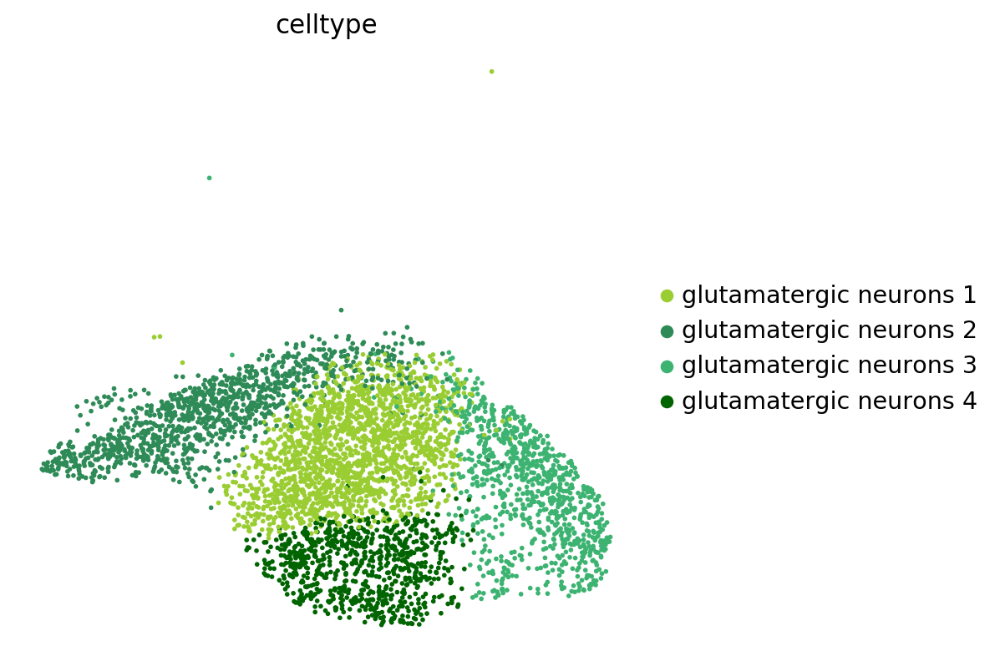

In [52]:
sc.pl.umap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    color=["celltype"],
    ncols=1
)

Connectivity:

Trying to set attribute `.uns` of view, copying.


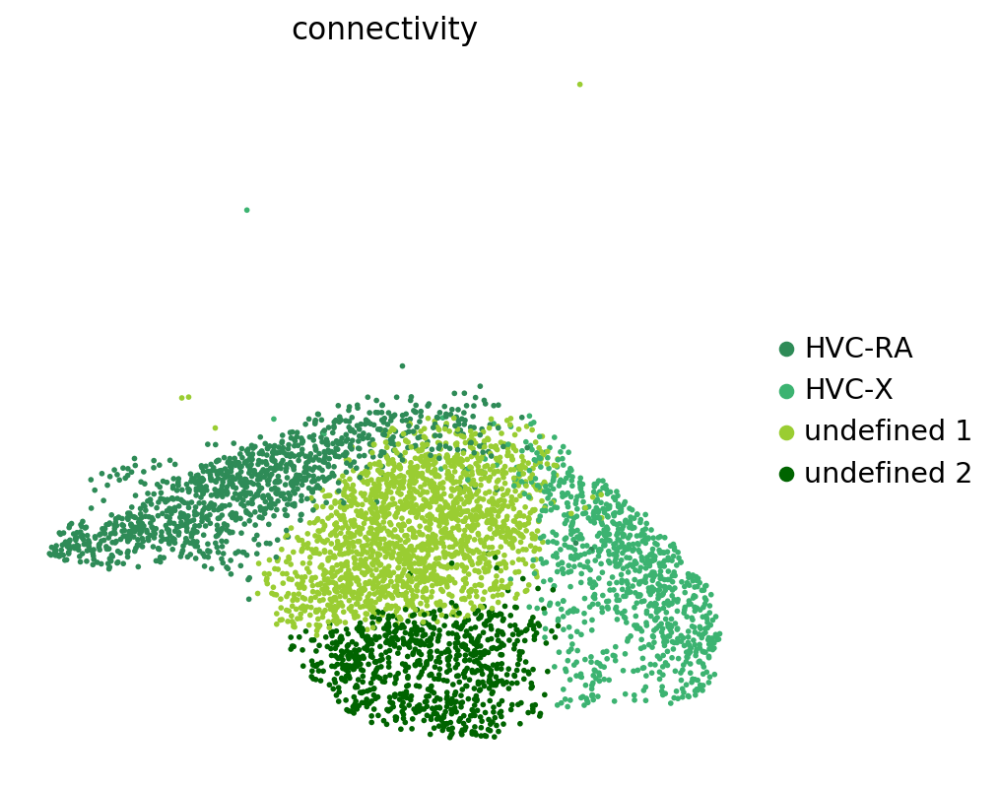

In [53]:
sc.pl.umap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    color=["connectivity"],
    palette=palette_glut,
#     ncols=1
)

This assignment makes sense given that WRE is expressed mostly in WRE (see graph below of WRE expression). We do not know why AAVs target HVC-X more succesfully than HVC-RA neurons, but this coincides with what we previouly observed in the lab based on overlap between viral fluorophore expression and tracers from RA or from X.

In [54]:
markers = [
    "UTS2B_ENSTGUG00000009278.2",
    "HPCAL1_ENSTGUG00000013044.2",
    "ALDH1A2_ENSTGUG00000006178.2",
    "DCN_ENSTGUG00000008178.2",
    "FNDC9_ENSTGUG00000000654.2",
    "NTS_ENSTGUG00000027877.1",
    "SST_ENSTGUG00000027783.1",
    "PVALB_ENSTGUG00000010713.2",
#     "CALB1_ENSTGUG00000011825.2",
#     "CALB2_ENSTGUG00000005987.2",
    "BDNF_ENSTGUG00000004743.2",
    "FOSL2_ENSTGUG00000024611.1",
    "HOMER1_ENSTGUG00000003711.2",
    "ARC_ENSTGUG00000012727.2",
    "TNFAIP8L3_ENSTGUG00000028388.1",
    "EGR1_ENSTGUG00000000003.2",
]

Trying to set attribute `.uns` of view, copying.


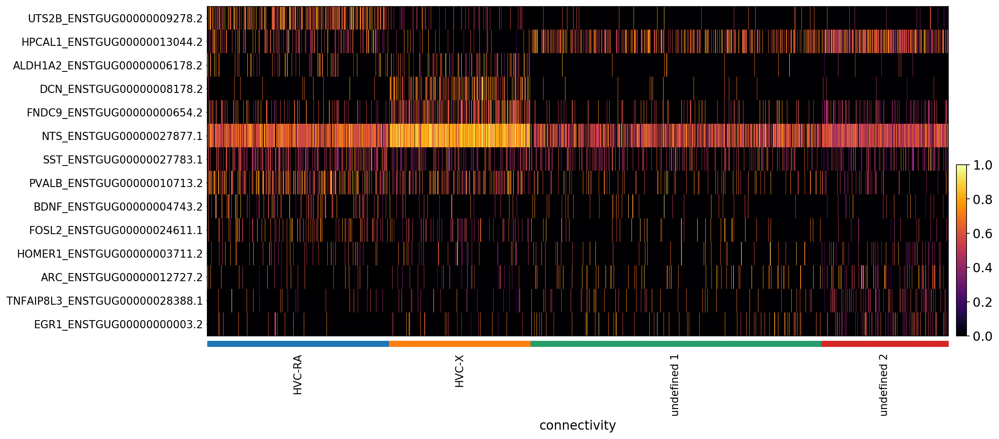

In [55]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    markers,
    groupby="connectivity",
    show_gene_labels=True,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, len(markers)/2)
)

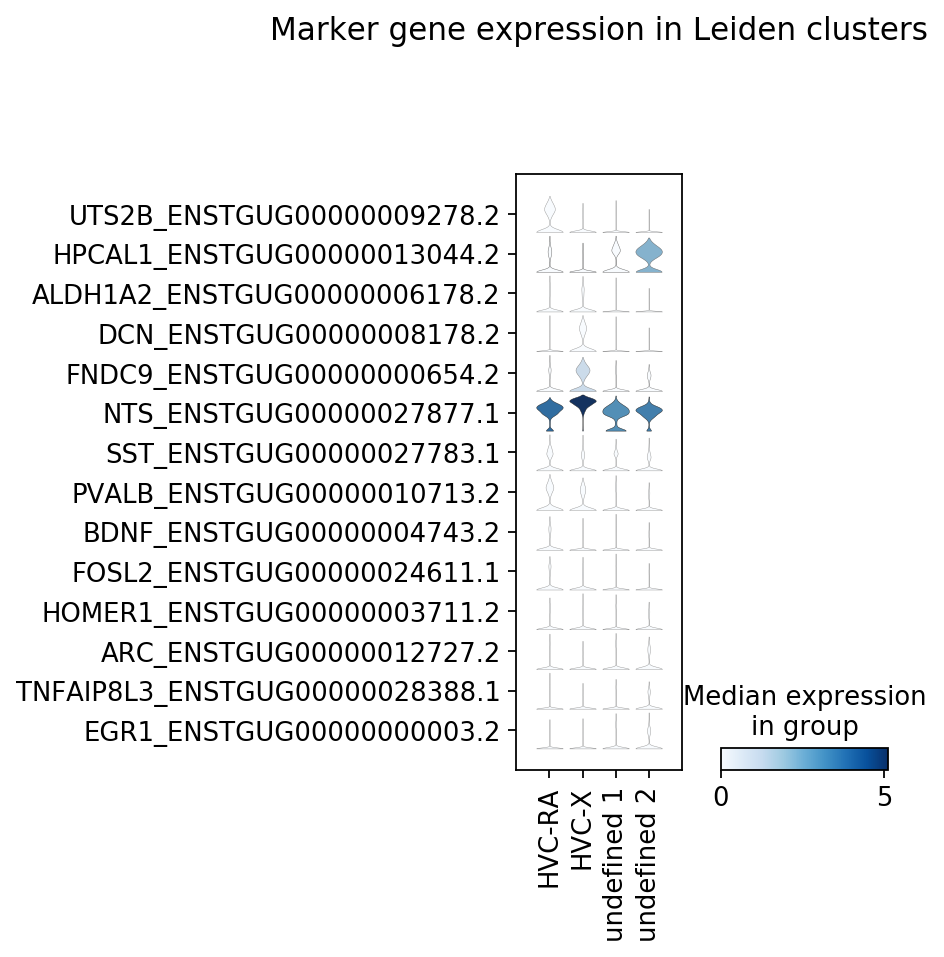

In [56]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     markers, 
                     groupby='connectivity', 
                     title="Marker gene expression in Leiden clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True
                    )

UTS2B (Urotensin 2B): Among its related pathways are Peptide ligand-binding receptors and Signaling by GPCR. Gene Ontology (GO) annotations related to this gene include hormone activity and G protein-coupled receptor binding.  

HPCAL1 (Hippocalcin Like 1): The protein encoded by this gene is a member of neuron-specific calcium-binding proteins family found in the retina and brain. It is highly similar to human hippocalcin protein and nearly identical to the rat and mouse hippocalcin like-1 proteins. It may be involved in the calcium-dependent regulation of rhodopsin phosphorylation and may be of relevance for neuronal signalling in the central nervous system.   

ALDH1A2 (Aldehyde Dehydrogenase 1 Family Member A2): This protein belongs to the aldehyde dehydrogenase family of proteins. The product of this gene is an enzyme that catalyzes the synthesis of retinoic acid (RA) from retinaldehyde. Retinoic acid, the active derivative of vitamin A (retinol), is a hormonal signaling molecule that functions in developing and adult tissues. The studies of a similar mouse gene suggest that this enzyme and the cytochrome CYP26A1, concurrently establish local embryonic retinoic acid levels which facilitate posterior organ development and prevent spina bifida.  

DCN (decorin): This gene encodes a member of the small leucine-rich proteoglycan family of proteins. Alternative splicing results in multiple transcript variants, at least one of which encodes a preproprotein that is proteolytically processed to generate the mature protein. This protein plays a role in collagen fibril assembly. Binding of this protein to multiple cell surface receptors mediates its role in tumor suppression, including a stimulatory effect on autophagy and inflammation and an inhibitory effect on angiogenesis and tumorigenesis.

FNDC9 (Fibronectin Type III Domain Containing 9): Fibronectin is a high-molecular weight glycoprotein of the extracellular matrix that binds to membrane-spanning receptor proteins called integrins (https://en.wikipedia.org/wiki/Fibronectin).

NTS (Neurotensin): This gene encodes a common precursor for two peptides, neuromedin N and neurotensin. Neurotensin is a secreted tridecapeptide, which is widely distributed throughout the central nervous system, and may function as a neurotransmitter or a neuromodulator. It may be involved in dopamine-associated pathophysiological events, in the maintenance of gut structure and function, and in the regulation of fat metabolism. Neurotensin also exhibits antimicrobial activity against bacteria and fungi. Tissue-specific processing may lead to the formation in some tissues of larger forms of neuromedin N and neurotensin. The large forms may represent more stable peptides that are also biologically active.

Info from GeneCards unless otherwise noted

Heatmap showing DE genes per celltype:

In [57]:
leiden_markers[["12", "14", "11", "8"]].head(5)

,12,14,11,8
0,CD74_ENSTGUG00000000882.2,_ENSTGUG00000015659.2,SLC32A1_ENSTGUG00000004537.2,NTS_ENSTGUG00000027877.1
1,TMSB4X_ENSTGUG00000008243.2,_ENSTGUG00000019883.1,_ENSTGUG00000020792.1,CCK_ENSTGUG00000004682.2
2,_ENSTGUG00000019883.1,BEST1_ENSTGUG00000005934.2,ATP1B1_ENSTGUG00000013431.2,APP_ENSTGUG00000013557.2
3,BEST1_ENSTGUG00000005934.2,CD74_ENSTGUG00000000882.2,ATP6V0C_ENSTGUG00000003256.2,OLFM1_ENSTGUG00000006000.2
4,SAT1_ENSTGUG00000007289.2,_ENSTGUG00000023468.1,_ENSTGUG00000006670.2,SLC17A6_ENSTGUG00000004570.2


In [58]:
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order and remove duplications
l_markers_conn = pd.unique(leiden_markers[["12", "14", "11", "8"]].head(5).values.ravel('K')) #.ravel('K') makes sure that the values for each columns stay together instead of going per row

Trying to set attribute `.uns` of view, copying.


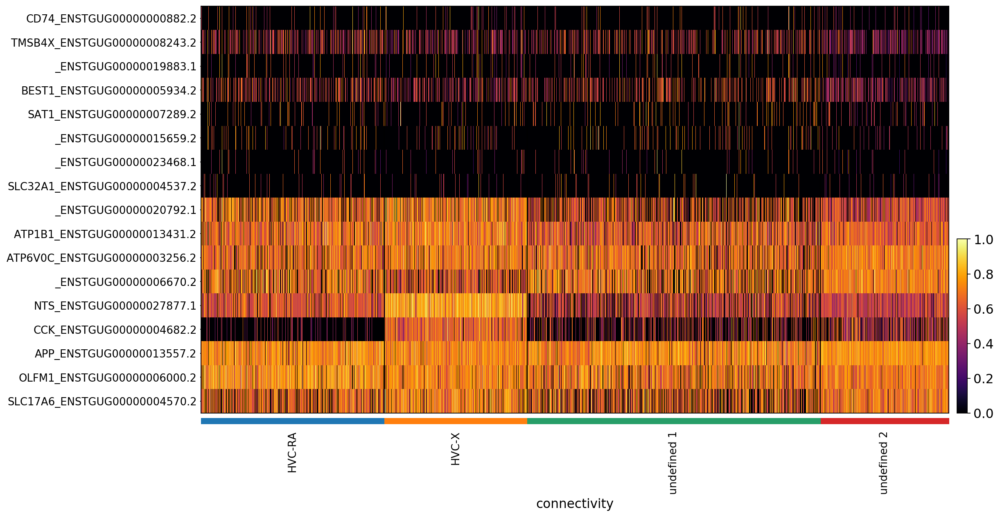

In [59]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    l_markers_conn,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, len(l_markers_conn)/2)
)

# Find DE genes between defined HVC-RA and HVC-X clusters

In [60]:
adata_hvcxra = adata[np.char.startswith(nd(adata.obs.connectivity.values).astype(str), "HVC")]

In [61]:
sc.tl.rank_genes_groups(adata_hvcxra, groupby='connectivity', method='t-test', corr_method="bonferroni", use_raw=False)

Trying to set attribute `.uns` of view, copying.


Score = z-score underlying the computation of a p-value for each gene for each group

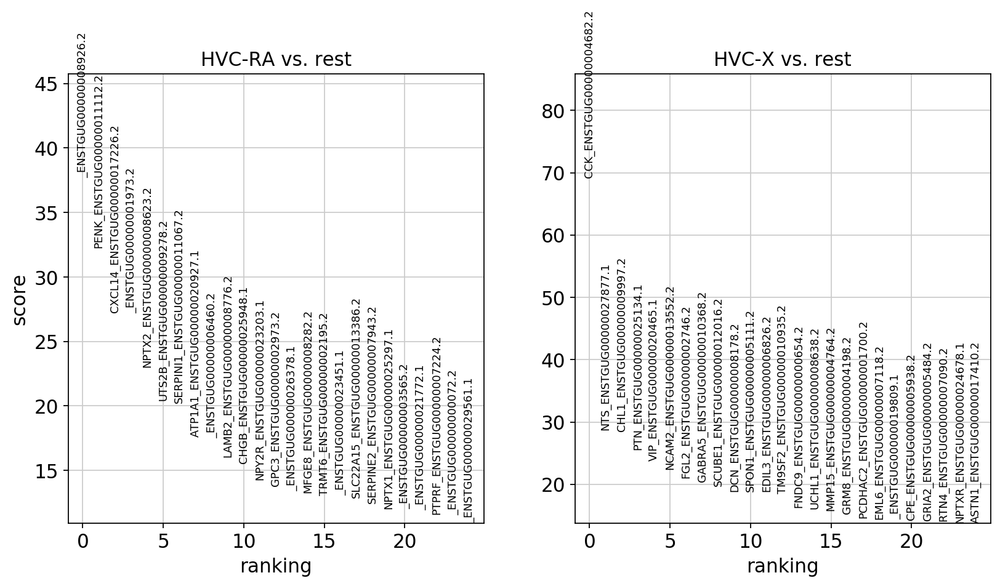

In [62]:
sc.pl.rank_genes_groups(adata_hvcxra, n_genes=25, sharey=False, save=False)

In [63]:
hvcxra_markers = pd.DataFrame(adata_hvcxra.uns['rank_genes_groups']['names']).head(20)
hvcxra_markers

,HVC-RA,HVC-X
0,_ENSTGUG00000008926.2,CCK_ENSTGUG00000004682.2
1,PENK_ENSTGUG00000011112.2,NTS_ENSTGUG00000027877.1
2,CXCL14_ENSTGUG00000017226.2,CHL1_ENSTGUG00000009997.2
3,_ENSTGUG00000001973.2,PTN_ENSTGUG00000025134.1
4,NPTX2_ENSTGUG00000008623.2,VIP_ENSTGUG00000020465.1
5,UTS2B_ENSTGUG00000009278.2,NCAM2_ENSTGUG00000013552.2
6,SERPINI1_ENSTGUG00000011067.2,FGL2_ENSTGUG00000002746.2
7,ATP1A1_ENSTGUG00000020927.1,GABRA5_ENSTGUG00000010368.2
8,_ENSTGUG00000006460.2,SCUBE1_ENSTGUG00000012016.2
9,LAMB2_ENSTGUG00000008776.2,DCN_ENSTGUG00000008178.2


Display top 5 DE to try in EXP notebook:

In [64]:
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order and remove duplications
hvcxra_markers_top5 = pd.unique(hvcxra_markers.head(5).values.ravel('K')) #.ravel('K') makes sure that the values for each columns stay together instead of going per row

In [65]:
hvcxra_markers_top5

array(['_ENSTGUG00000008926.2', 'PENK_ENSTGUG00000011112.2',
       'CXCL14_ENSTGUG00000017226.2', '_ENSTGUG00000001973.2',
       'NPTX2_ENSTGUG00000008623.2', 'CCK_ENSTGUG00000004682.2',
       'NTS_ENSTGUG00000027877.1', 'CHL1_ENSTGUG00000009997.2',
       'PTN_ENSTGUG00000025134.1', 'VIP_ENSTGUG00000020465.1'],
      dtype=object)

Trying to set attribute `.uns` of view, copying.


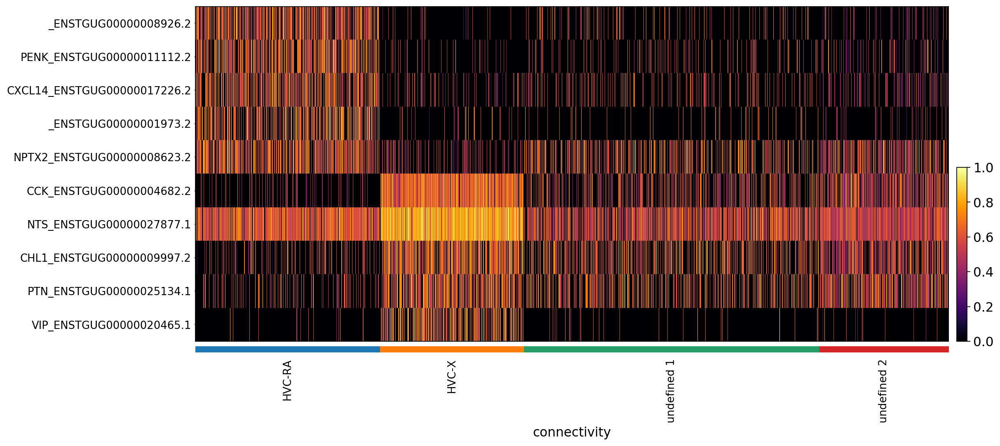

In [66]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    hvcxra_markers_top5,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 7)
)

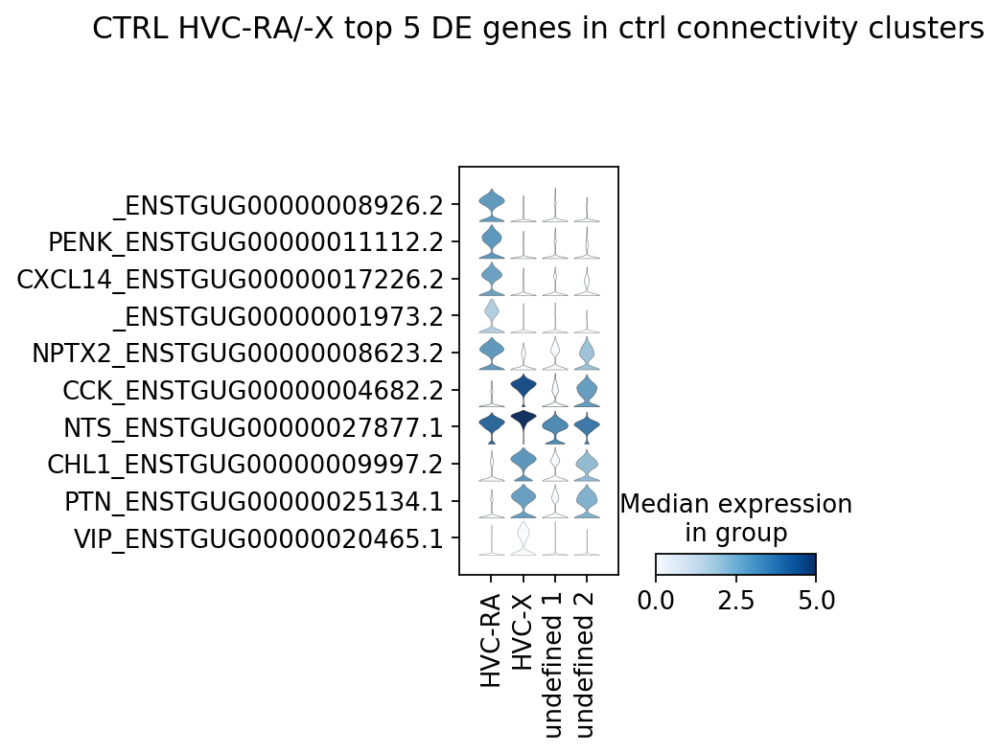

In [67]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     hvcxra_markers_top5, 
                     groupby='connectivity', 
                     title="CTRL HVC-RA/-X top 5 DE genes in ctrl connectivity clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
                     vmin=0,
                     vmax=5                    
)

# Hypothesis: Undefined 1 might be an immature or inactive HVC-RA cluster and undefined 2 an immature or inactive HVC-X cluster since some marker genes are expressed, although at a lower level and in conjuction with GRIA4 (see below), while immediate early gene expression is lower.

___

# Compare to Colquitt HVC_Glut markers
GFRA1 (HVC_Glut-1/4), BDNF (HVC_Glut-4), GRIA4 (HVC_Glut-2), SCUBE1 (HVC_Glut-3), CACNA1G (HVC_Glut-5).

![Cat](colquitt_glut.jpg)

In [68]:
colquitt = [
    "SLC17A6_ENSTGUG00000004570.2",
    "GFRA1_ENSTGUG00000018882.1",
    "GRIA4_ENSTGUG00000012676.2",
    "SCUBE1_ENSTGUG00000012016.2",
    "CACNA1G_ENSTGUG00000009049.2",
    "BDNF_ENSTGUG00000004743.2",
]

Trying to set attribute `.uns` of view, copying.


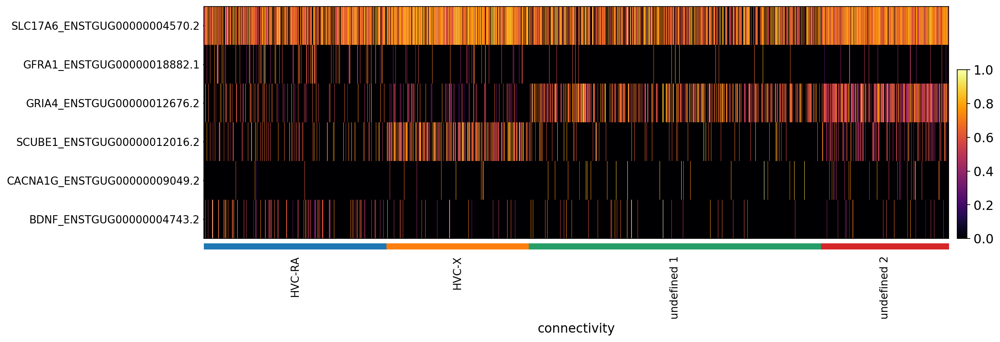

In [69]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    colquitt,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 5)
)

HVC-X: SCUBE1  
HVC-RA: GFRA1, BDNF (activity)  
immature HVC-RA ? : GRIA4  

The HVC_Glut-1 and HVC_Glut-4 marker gene GFRA1 was elevated in retrogradely identified HVCRA neurons (fig. S2, F and G), and these clusters express relatively high levels of the previously identified HVCRA marker UTS2B (26) (fig. S2, A and H). The expression of several activity-dependent genes (BDNF, HOMER1, and FOSL2) suggests that HVC_Glut-4 may represent an active population of HVC_Glut-1 neurons (Fig. 2C and fig. S2, A and I). [...] The HVC_Glut-3 marker SCUBE1 was elevated in retrogradely labeled HVCX neurons (fig. S2, F and G), and HVC_Glut-3 was enriched for the known HVCX marker NTS (31) (fig. S2, A and H). Although marker genes for HVCAv have not yet been reported, the abundance of cells in HVC_Glut-5 (~2% of projection neurons) is comparable to that seen in a previous retrograde tracing analysis of HVCAv neurons (25) (fig. S1J). [...] HVC_Glut-2 lies at the terminus of the neurogenic lineage (Fig. 1E) and is enriched for genes involved in dendritogenesis and synaptogenesis (fig. S1G) and therefore may constitute an immature population of HVCRA neurons, which are known to undergo replacement in adult songbirds (17–20).

### Are these enriched for neurogenesis markers?

In [70]:
neurogenesis = marker_gene_mat.loc[marker_gene_mat['mammalian neurogenesis'] != 0].index.values

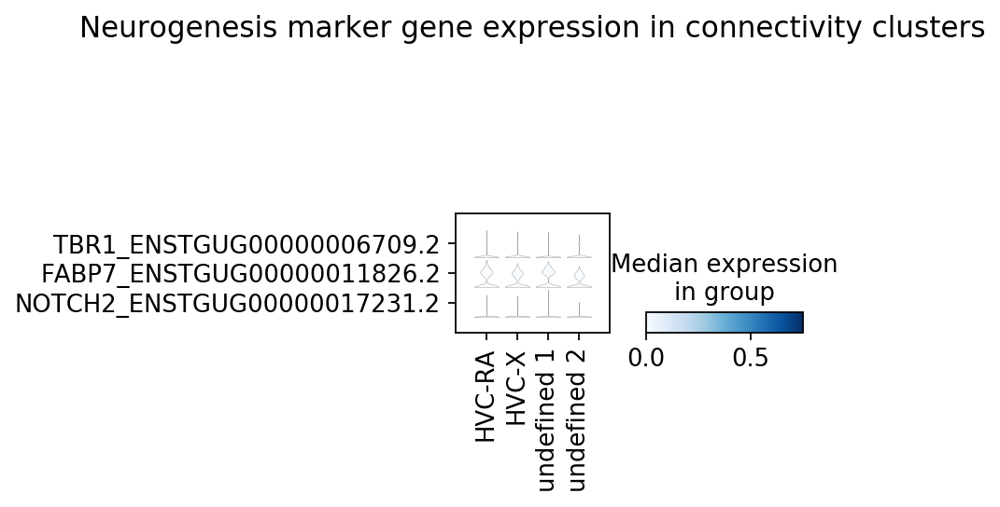

In [71]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     neurogenesis, 
                     groupby='connectivity', 
                     title="Neurogenesis marker gene expression in connectivity clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
                     vmin=0,
                     vmax=0.75
                    )

___

# DE genes HVC-X versus undefined 1

In [72]:
adata_hvcx = adata[np.char.startswith(nd(adata.obs.connectivity.values).astype(str), "HVC-X")]
adata_u1 = adata[np.char.startswith(nd(adata.obs.connectivity.values).astype(str), "undefined 1")]

adata_hvcx_u1 = adata_hvcx.concatenate(adata_u1, 
                             join='outer', 
                             batch_key='batch_index', 
                             batch_categories=None, 
                             uns_merge=None,
                             fill_value=np.nan)

In [73]:
sc.tl.rank_genes_groups(adata_hvcx_u1, groupby='connectivity', method='t-test', corr_method="bonferroni", use_raw=False)

... storing 'leiden' as categorical
... storing 'celltype' as categorical
... storing 'connectivity' as categorical


Score = z-score underlying the computation of a p-value for each gene for each group

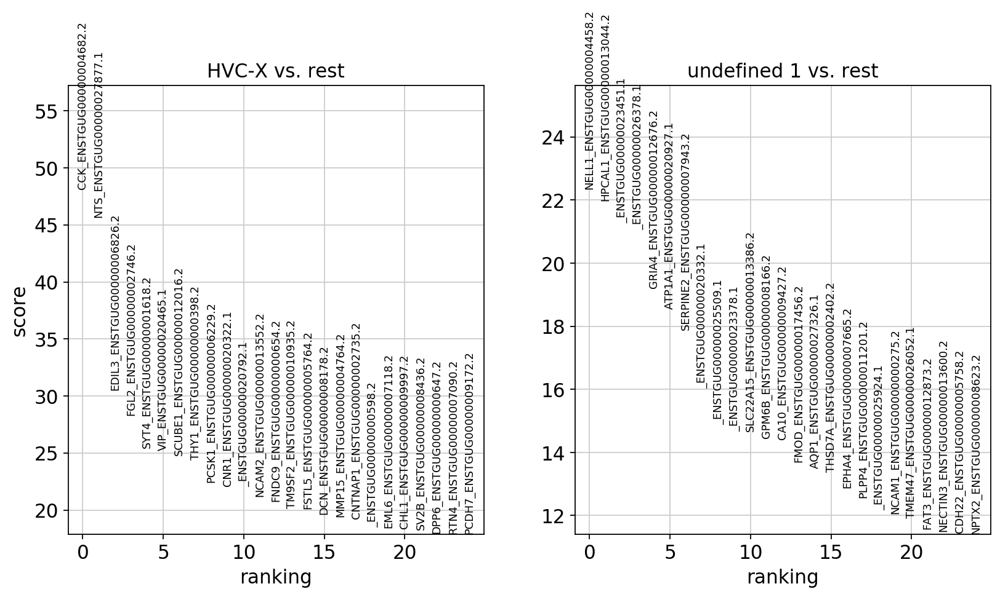

In [74]:
sc.pl.rank_genes_groups(adata_hvcx_u1, n_genes=25, sharey=False, save=False)

In [75]:
hvcxu1_markers = pd.DataFrame(adata_hvcx_u1.uns['rank_genes_groups']['names']).head(20)
hvcxu1_markers.head()

,HVC-X,undefined 1
0,CCK_ENSTGUG00000004682.2,NELL1_ENSTGUG00000004458.2
1,NTS_ENSTGUG00000027877.1,HPCAL1_ENSTGUG00000013044.2
2,EDIL3_ENSTGUG00000006826.2,_ENSTGUG00000023451.1
3,FGL2_ENSTGUG00000002746.2,_ENSTGUG00000026378.1
4,SYT4_ENSTGUG00000001618.2,GRIA4_ENSTGUG00000012676.2


# DE genes HVC-X versus undefined 2
Not relevant since undefined 2 is probably from outside HVC (see expression of SCN3B).

In [76]:
# adata_u2 = adata[np.char.startswith(nd(adata.obs.connectivity.values).astype(str), "undefined 2")]

# adata_hvcx_u2 = adata_hvcx.concatenate(adata_u2, 
#                              join='outer', 
#                              batch_key='batch_index', 
#                              batch_categories=None, 
#                              uns_merge=None,
#                              fill_value=np.nan)

In [77]:
# sc.tl.rank_genes_groups(adata_hvcx_u2, groupby='connectivity', method='t-test', corr_method="bonferroni", use_raw=False)

Score = z-score underlying the computation of a p-value for each gene for each group

In [78]:
# sc.pl.rank_genes_groups(adata_hvcx_u2, n_genes=25, sharey=False, save=False)

In [79]:
# hvcxu2_markers = pd.DataFrame(adata_hvcx_u2.uns['rank_genes_groups']['names']).head(20)
# hvcxu2_markers.head()

# DE genes HVC-RA versus undefined 1

In [80]:
adata_ra = adata[np.char.startswith(nd(adata.obs.connectivity.values).astype(str), "HVC-RA")]

adata_ra_u1 = adata_ra.concatenate(adata_u1, 
                             join='outer', 
                             batch_key='batch_index', 
                             batch_categories=None, 
                             uns_merge=None,
                             fill_value=np.nan)

In [81]:
sc.tl.rank_genes_groups(adata_ra_u1, groupby='connectivity', method='t-test', corr_method="bonferroni", use_raw=False)

... storing 'leiden' as categorical
... storing 'celltype' as categorical
... storing 'connectivity' as categorical


Score = z-score underlying the computation of a p-value for each gene for each group

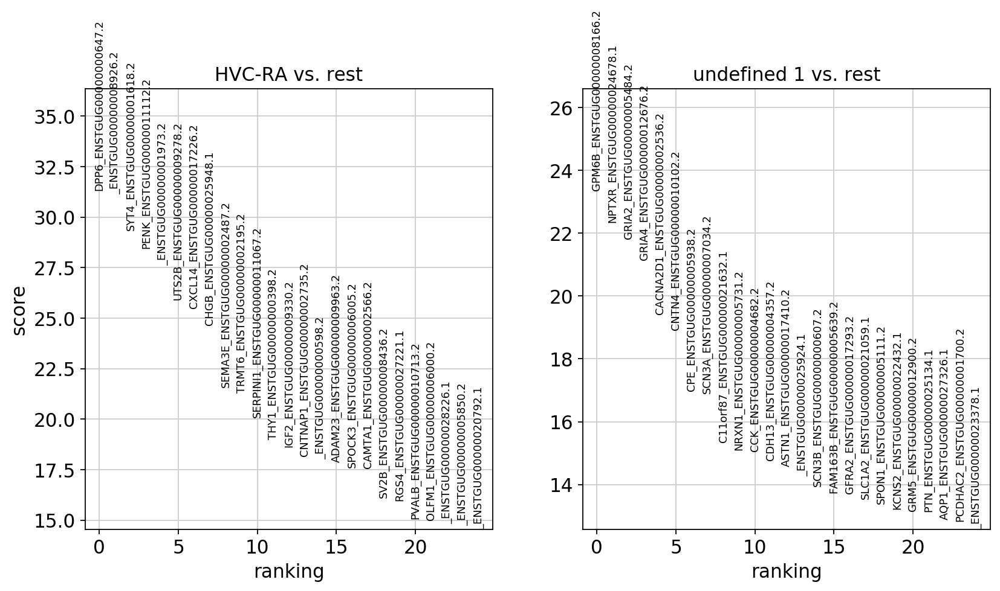

In [82]:
sc.pl.rank_genes_groups(adata_ra_u1, n_genes=25, sharey=False, save=False)

In [83]:
hvcrau1_markers = pd.DataFrame(adata_ra_u1.uns['rank_genes_groups']['names']).head(20)
hvcrau1_markers.head()

,HVC-RA,undefined 1
0,DPP6_ENSTGUG00000000647.2,GPM6B_ENSTGUG00000008166.2
1,_ENSTGUG00000008926.2,NPTXR_ENSTGUG00000024678.1
2,SYT4_ENSTGUG00000001618.2,GRIA2_ENSTGUG00000005484.2
3,PENK_ENSTGUG00000011112.2,GRIA4_ENSTGUG00000012676.2
4,_ENSTGUG00000001973.2,CACNA2D1_ENSTGUG00000002536.2


# DE genes HVC-RA versus undefined 2
Not relevant since undefined 2 is probably from outside HVC (see expression of SCN3B).

In [84]:
# adata_ra_u2 = adata_ra.concatenate(adata_u2, 
#                              join='outer', 
#                              batch_key='batch_index', 
#                              batch_categories=None, 
#                              uns_merge=None,
#                              fill_value=np.nan)

In [85]:
# sc.tl.rank_genes_groups(adata_ra_u2, groupby='connectivity', method='t-test', corr_method="bonferroni", use_raw=False)

Score = z-score underlying the computation of a p-value for each gene for each group

In [86]:
# sc.pl.rank_genes_groups(adata_ra_u2, n_genes=25, sharey=False, save=False)

In [87]:
# hvcrau2_markers = pd.DataFrame(adata_ra_u2.uns['rank_genes_groups']['names']).head(20)
# hvcrau2_markers.head()

# DE genes undefined 1 versus undefined 2
Not relevant since undefined 2 is probably from outside HVC (see expression of SCN3B).

In [88]:
# adata_u1_u2 = adata_u1.concatenate(adata_u2, 
#                              join='outer', 
#                              batch_key='batch_index', 
#                              batch_categories=None, 
#                              uns_merge=None,
#                              fill_value=np.nan)

In [89]:
# sc.tl.rank_genes_groups(adata_u1_u2, groupby='connectivity', method='t-test', corr_method="bonferroni", use_raw=False)

Score = z-score underlying the computation of a p-value for each gene for each group

In [90]:
# sc.pl.rank_genes_groups(adata_u1_u2, n_genes=25, sharey=False, save=False)

In [91]:
# hvcu1u2_markers = pd.DataFrame(adata_u1_u2.uns['rank_genes_groups']['names']).head(20)
# hvcu1u2_markers.head()

___

# Final figure

In [92]:
all_markers = [
    "SLC17A6_ENSTGUG00000004570.2",
    "UTS2B_ENSTGUG00000009278.2",
    "HPCAL1_ENSTGUG00000013044.2",
    "ALDH1A2_ENSTGUG00000006178.2",
    "DCN_ENSTGUG00000008178.2",
    "FNDC9_ENSTGUG00000000654.2",
    "NTS_ENSTGUG00000027877.1",
#    
    "_ENSTGUG00000008926.2", 
    'PENK_ENSTGUG00000011112.2',
    'CXCL14_ENSTGUG00000017226.2', 
    '_ENSTGUG00000001973.2',
    'NPTX2_ENSTGUG00000008623.2',
#    
    'CCK_ENSTGUG00000004682.2',
    'CHL1_ENSTGUG00000009997.2',
    'PTN_ENSTGUG00000025134.1',
    'VIP_ENSTGUG00000020465.1',
#
    '_ENSTGUG00000023451.1',
    '_ENSTGUG00000026378.1',
    'GRIA2_ENSTGUG00000005484.2',
    'GRIA4_ENSTGUG00000012676.2',
    'GPM6B_ENSTGUG00000008166.2', 
    'NPTXR_ENSTGUG00000024678.1',
    'CACNA2D1_ENSTGUG00000002536.2',
#    
    "GFRA1_ENSTGUG00000018882.1",
    "SCUBE1_ENSTGUG00000012016.2",    
    "CACNA1G_ENSTGUG00000009049.2",
#
    "BDNF_ENSTGUG00000004743.2",
    "FOSL2_ENSTGUG00000024611.1",
    "HOMER1_ENSTGUG00000003711.2",
    "ARC_ENSTGUG00000012727.2",
    "TNFAIP8L3_ENSTGUG00000028388.1",
    "EGR1_ENSTGUG00000000003.2",
#    
    'TBR1_ENSTGUG00000006709.2', 
    'FABP7_ENSTGUG00000011826.2',
    'NOTCH2_ENSTGUG00000017231.2',
    "NELL1_ENSTGUG00000004458.2",
##
#     "_ENSTGUG00000017273.2",
#     "_ENSTGUG00000028417.1",
#     "_ENSTGUG00000004607.2",
##
#     "NPTXR_ENSTGUG00000024678.1",
#     "NPTX1_ENSTGUG00000025297.1", 
#     "NPTX2_ENSTGUG00000008623.2",  
#     "NRXN1_ENSTGUG00000005731.2",
#     "CNTN4_ENSTGUG00000010102.2",
#     "CACNA2D1_ENSTGUG00000002536.2",
]

# Define marker groups
var_groups = [
    (0, 0),
    (1, 2),
    (3, 6),
    (7, 11),
    (12, 15),
    (16, 22),
    (23, 23),
    (24, 24),
    (25, 25),
    (26, 31),
    (32, 35),
#     (36, 38),
#     (39, 44)
]

# Define marker group labels
var_labels = [
    "Glutamatergic neuron marker",
    "HVC-RA markers",
    "HVC-X markers",
    "HVC-RA DE genes",
    "HVC-X DE genes",
    "undefined 1 DE genes",
    "Colquitt HVC-RA",
    "Colquitt HVC-X",
    "Colquitt HVC-Av",
    "Neuronal activity markers",
    "Neurogenesis markers",
#     "MHC-associated",
#     "Synaptogenesis (DE from CTRL undefined)"
]

Trying to set attribute `.uns` of view, copying.


Control


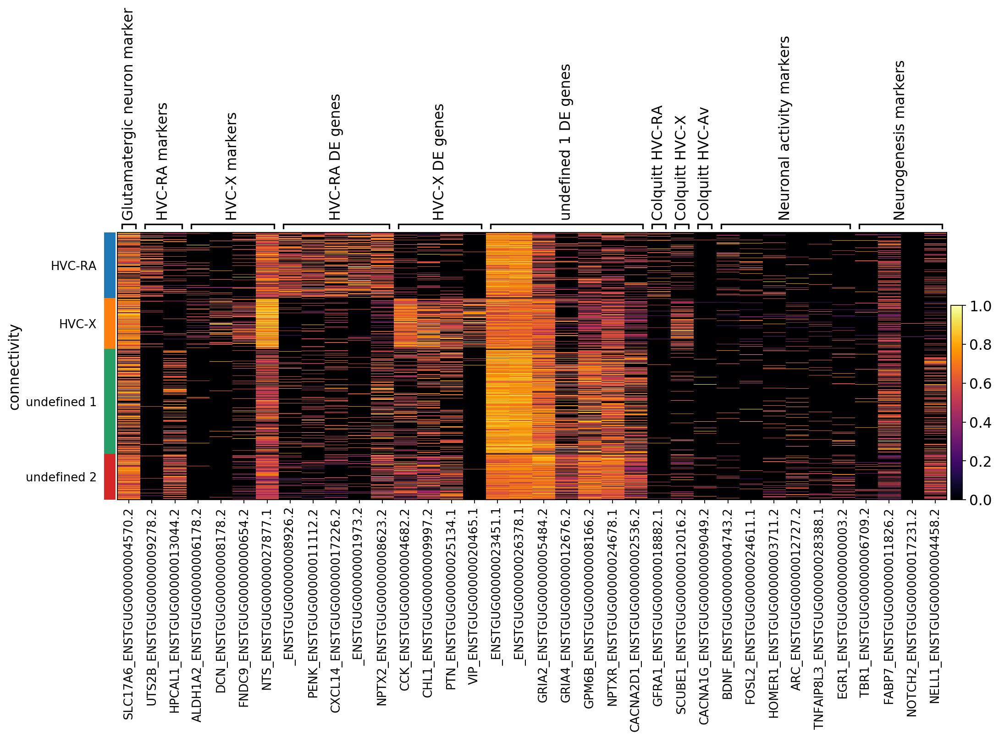

In [93]:
print("Control")
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    all_markers,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
    var_group_positions=var_groups,
    var_group_labels=var_labels,
#     var_group_rotation=45,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(15, 5),
    save=False
)

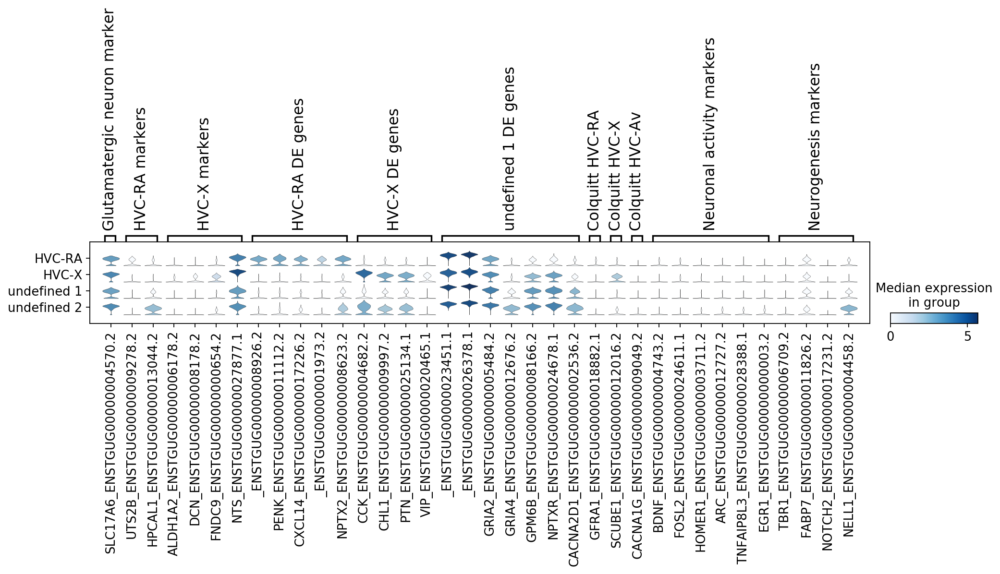

In [94]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     all_markers, 
                     groupby='connectivity', 
#                      title="Marker gene expression in connectivity clusters", 
                     var_group_positions=var_groups,
                     var_group_labels=var_labels,
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=False,
                     save=False
#                      vmin=0,
#                      vmax=0.75
                    )

Control


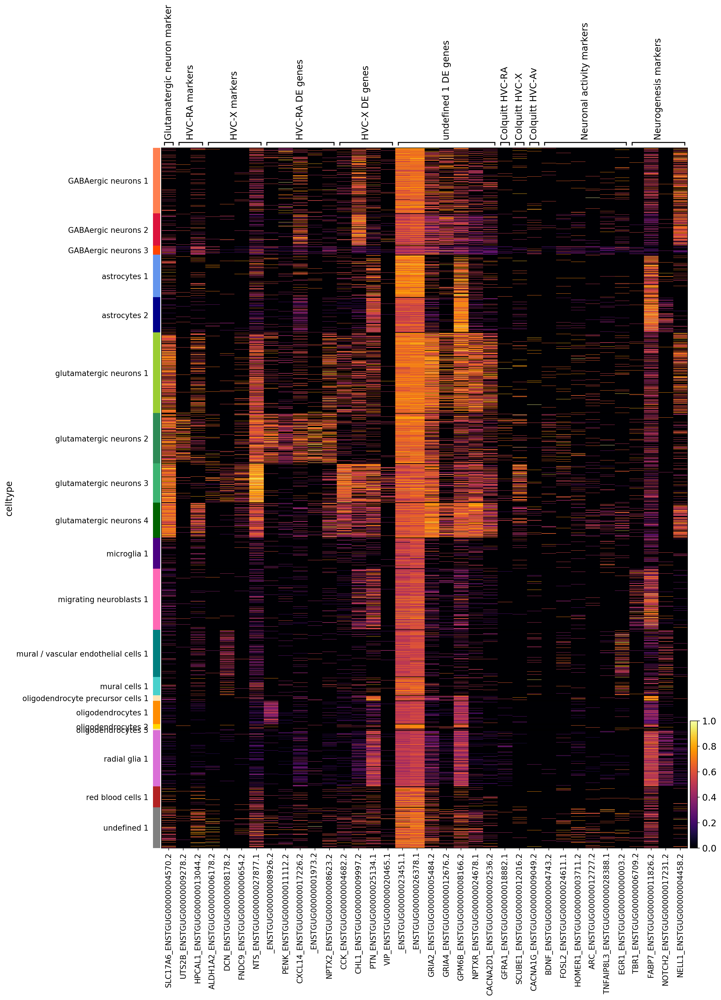

In [95]:
print("Control")
sc.pl.heatmap(
    adata,
    all_markers,
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
    var_group_positions=var_groups,
    var_group_labels=var_labels,
#     var_group_rotation=45,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(15, 20),
    save=False
)

___

# Save control dataset with celltype assignment

In [96]:
# # Convert connectivity to string, otherwise .write does not work
# adata.obs["connectivity"] = adata.obs["connectivity"].astype(str)

In [97]:
# adata.write("../../finchseq_data/ctrl_celltype.h5ad")